In [ ]:
#importing libraries
import warnings
warnings.filterwarnings('ignore')
 
import math
import pandas as pd
import numpy as npp

import numpy as np
import pandas as pd
from sklearn.preprocessing import OneHotEncoder
 
import matplotlib.pyplot as plt
import seaborn as sns
 
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Dense, Activation
 
import nltk
from nltk.classify import NaiveBayesClassifier
from nltk.corpus import subjectivity
from nltk.sentiment import SentimentAnalyzer
from nltk.sentiment.util import *
 
from sklearn import preprocessing, metrics
from sklearn.preprocessing import MinMaxScaler
for i in ['gutenberg','punkt','vader_lexicon']:              
  nltk.download(str(i))
from nltk.sentiment.vader import SentimentIntensityAnalyzer as vader
print('Libraries Imported')

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Unzipping corpora/gutenberg.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


Libraries Imported


In [ ]:
 ! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     / 22.6 MB 22.2 MB/s 0:00:02
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.8/33.8 MB 15.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 84.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 KB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 KB 6.8 MB/s eta 0:00:00
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=344995 sha256=8992b86788b361fdace15ecfe6edbbd7a881067011a7df68c0549ae0efc09b6f
  Stored in directory: /tmp/pip-ephem-wheel-cache-7iy2kz8s/wheels/43/c8/f4/c0ebc32d7f20fe89d0e92d90eaeef5f0c0594a89b6bc16b352
Successfully built ydata-profiling
  Attempting uninstall: tqdm
    Found existing installation: tqdm 4.65.0
    Uninstalling tqdm-4.65.0:
      Successfully uninstalled tqdm-4.65.0
  Attempting uninsta

In [ ]:
stock_price=pd.read_csv('/content/NEWS_YAHOO_stock_prediction (1).csv')
stock_price

,Unnamed: 0,ticker,Date,category,title,content,Open,High,Low,Close,Adj Close,Volume,label
0,0,AAPL,2020-01-27,opinion,Apple Set To Beat Q1 Earnings Estimates Tech ...,Technology giant Apple NASDAQ AAPL is set ...,77.514999,77.942497,76.220001,77.237503,75.793358,161940000,0
1,1,AAPL,2020-01-27,opinion,Tech Daily Intel Results Netflix Surge Appl...,The top stories in this digest are Intel s N...,77.514999,77.942497,76.220001,77.237503,75.793358,161940000,0
2,2,AAPL,2020-01-27,opinion,7 Monster Stock Market Predictions For The Wee...,S P 500 SPY \nThis week will be packed with e...,77.514999,77.942497,76.220001,77.237503,75.793358,161940000,0
3,3,AAPL,2020-01-27,opinion,Apple Earnings Preview 5G Launch Expanding S...,Reports Q1 2020 results on Tuesday Jan 28 ...,77.514999,77.942497,76.220001,77.237503,75.793358,161940000,0
4,4,AAPL,2020-01-27,opinion,Buy Surging Apple Microsoft Stock Before Qua...,On today s episode of Full Court Finance here ...,77.514999,77.942497,76.220001,77.237503,75.793358,161940000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15970,15970,AAPL,2012-07-31,opinion,What s Driving China s Real Estate Rally Par...,In the preceding posts I examined the first t...,21.543928,21.846430,21.525715,21.812857,18.624512,462327600,1
15971,15971,AAPL,2012-07-31,opinion,50 Stocks With The Best Dividend Growth In Jul...,Here is a current sheet of companies with fast...,21.543928,21.846430,21.525715,21.812857,18.624512,462327600,1
15972,15972,AAPL,2012-07-23,opinion,Summer Heat Scorches Europe And U S,Europe flares as summer heat continues Summer...,21.228571,21.639286,20.989643,21.565357,18.413187,487975600,1
15973,15973,AAPL,2012-07-23,opinion,Apple Earnings Preview Quarterly Dip On Deck,Last quarter Apple AAPL reported the 2nd bes...,21.228571,21.639286,20.989643,21.565357,18.413187,487975600,1


In [ ]:
ohe = OneHotEncoder()
ohe.fit_transform(stock_price[["category"]]).toarray()
feature_arry = ohe.fit_transform(stock_price[["category"]]).toarray()
print(feature_arry)

[[0. 1.]
 [0. 1.]
 [0. 1.]
 ...
 [0. 1.]
 [0. 1.]
 [0. 1.]]


In [ ]:
ohe.categories_

[array(['news', 'opinion'], dtype=object)]

In [ ]:
feature_labels = ohe.categories_
np.array(feature_labels).ravel()
feature_labels = np.array(feature_labels).ravel()
print(feature_labels)

['news' 'opinion']


In [ ]:
features = pd.DataFrame(feature_arry, columns = feature_labels)

In [ ]:
stock_price = pd.concat([stock_price, features], axis=1)

In [ ]:
stock_price.columns

Index(['Unnamed: 0', 'ticker', 'Date', 'category', 'title', 'content', 'Open',
       'High', 'Low', 'Close', 'Adj Close', 'Volume', 'label', 'news',
       'opinion'],
      dtype='object')

In [ ]:
# dropping duplicates
stock_price = stock_price.drop_duplicates()

# coverting the datatype of column 'Date' from type object to type 'datetime'
stock_price['Date'] = pd.to_datetime(stock_price['Date']).dt.normalize()

# filtering the important columns required
stock_price = stock_price.filter([ 'Date', 'category', 'title', 'content', 'Open',
       'High', 'Low', 'Close', 'Volume', 'label', 'news',
       'opinion'])

# setting column 'Date' as the index column
stock_price.set_index('Date', inplace= True)

# sorting the data according to the index i.e 'Date'
stock_price = stock_price.sort_index(ascending=True, axis=0)
stock_price

,category,title,content,Open,High,Low,Close,Volume,label,news,opinion
Date,,,,,,,,,,,
2012-07-23,opinion,Trade Apple After Earnings,It may look like a spider web but the mishmas...,21.228571,21.639286,20.989643,21.565357,487975600,1,0.0,1.0
2012-07-23,opinion,Apple Earnings Preview Quarterly Dip On Deck,Last quarter Apple AAPL reported the 2nd bes...,21.228571,21.639286,20.989643,21.565357,487975600,1,0.0,1.0
2012-07-23,opinion,Summer Heat Scorches Europe And U S,Europe flares as summer heat continues Summer...,21.228571,21.639286,20.989643,21.565357,487975600,1,0.0,1.0
2012-07-24,opinion,Market Bait And Switch,That is the sound we are going to hear soon fr...,21.692142,21.774286,21.375357,21.461430,565132400,0,0.0,1.0
2012-07-27,opinion,Will AAPL Fall From The Tree,Apple s AAPL sales for the third quarter mis...,20.536072,20.922501,20.413929,20.898571,403936400,1,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
2020-01-27,opinion,Buy Surging Apple Microsoft Stock Before Qua...,On today s episode of Full Court Finance here ...,77.514999,77.942497,76.220001,77.237503,161940000,0,0.0,1.0
2020-01-27,opinion,Apple Earnings Preview 5G Launch Expanding S...,Reports Q1 2020 results on Tuesday Jan 28 ...,77.514999,77.942497,76.220001,77.237503,161940000,0,0.0,1.0
2020-01-27,opinion,7 Monster Stock Market Predictions For The Wee...,S P 500 SPY \nThis week will be packed with e...,77.514999,77.942497,76.220001,77.237503,161940000,0,0.0,1.0


In [ ]:
stock_price['compound_tit'] = ''
stock_price['negative_tit'] = ''
stock_price['neutral_tit'] = ''
stock_price['positive_tit'] = ''
stock_price['compound_con'] = ''
stock_price['negative_con'] = ''
stock_price['neutral_con'] = ''
stock_price['positive_con'] = ''
stock_price.head()

,category,title,content,Open,High,Low,Close,Volume,label,news,opinion,compound_tit,negative_tit,neutral_tit,positive_tit,compound_con,negative_con,neutral_con,positive_con
Date,,,,,,,,,,,,,,,,,,,
2012-07-23,opinion,Trade Apple After Earnings,It may look like a spider web but the mishmas...,21.228571,21.639286,20.989643,21.565357,487975600,1,0.0,1.0,,,,,,,,
2012-07-23,opinion,Apple Earnings Preview Quarterly Dip On Deck,Last quarter Apple AAPL reported the 2nd bes...,21.228571,21.639286,20.989643,21.565357,487975600,1,0.0,1.0,,,,,,,,
2012-07-23,opinion,Summer Heat Scorches Europe And U S,Europe flares as summer heat continues Summer...,21.228571,21.639286,20.989643,21.565357,487975600,1,0.0,1.0,,,,,,,,
2012-07-24,opinion,Market Bait And Switch,That is the sound we are going to hear soon fr...,21.692142,21.774286,21.375357,21.461430,565132400,0,0.0,1.0,,,,,,,,
2012-07-27,opinion,Will AAPL Fall From The Tree,Apple s AAPL sales for the third quarter mis...,20.536072,20.922501,20.413929,20.898571,403936400,1,0.0,1.0,,,,,,,,


In [ ]:
stock_price.columns

Index(['category', 'title', 'content', 'Open', 'High', 'Low', 'Close',
       'Volume', 'label', 'news', 'opinion', 'compound_tit', 'negative_tit',
       'neutral_tit', 'positive_tit', 'compound_con', 'negative_con',
       'neutral_con', 'positive_con'],
      dtype='object')

In [ ]:
# importing requires libraries to analyze the sentiments
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import unicodedata

# instantiating the Sentiment Analyzer
sid = SentimentIntensityAnalyzer()

# calculating sentiment scores
stock_price['compound_tit'] = stock_price['title'].apply(lambda x: sid.polarity_scores(x)['compound'])
stock_price['negative_tit'] = stock_price['title'].apply(lambda x: sid.polarity_scores(x)['neg'])
stock_price['neutral_tit'] = stock_price['title'].apply(lambda x: sid.polarity_scores(x)['neu'])
stock_price['positive_tit'] = stock_price['title'].apply(lambda x: sid.polarity_scores(x)['pos'])

stock_price['compound_con'] = stock_price['content'].apply(lambda x: sid.polarity_scores(x)['compound'])
stock_price['negative_con'] = stock_price['content'].apply(lambda x: sid.polarity_scores(x)['neg'])
stock_price['neutral_con'] = stock_price['content'].apply(lambda x: sid.polarity_scores(x)['neu'])
stock_price['positive_con'] = stock_price['content'].apply(lambda x: sid.polarity_scores(x)['pos'])
# displaying the stock data
stock_price.head()

,category,title,content,Open,High,Low,Close,Volume,label,news,opinion,compound_tit,negative_tit,neutral_tit,positive_tit,compound_con,negative_con,neutral_con,positive_con
Date,,,,,,,,,,,,,,,,,,,
2012-07-23,opinion,Trade Apple After Earnings,It may look like a spider web but the mishmas...,21.228571,21.639286,20.989643,21.565357,487975600,1,0.0,1.0,0.0,0.0,1.0,0.0,0.9103,0.051,0.867,0.083
2012-07-23,opinion,Apple Earnings Preview Quarterly Dip On Deck,Last quarter Apple AAPL reported the 2nd bes...,21.228571,21.639286,20.989643,21.565357,487975600,1,0.0,1.0,0.0,0.0,1.0,0.0,0.9957,0.057,0.787,0.156
2012-07-23,opinion,Summer Heat Scorches Europe And U S,Europe flares as summer heat continues Summer...,21.228571,21.639286,20.989643,21.565357,487975600,1,0.0,1.0,0.0,0.0,1.0,0.0,-0.9239,0.062,0.893,0.045
2012-07-24,opinion,Market Bait And Switch,That is the sound we are going to hear soon fr...,21.692142,21.774286,21.375357,21.461430,565132400,0,0.0,1.0,0.0,0.0,1.0,0.0,-0.6101,0.094,0.805,0.101
2012-07-27,opinion,Will AAPL Fall From The Tree,Apple s AAPL sales for the third quarter mis...,20.536072,20.922501,20.413929,20.898571,403936400,1,0.0,1.0,0.0,0.0,1.0,0.0,0.7501,0.030,0.909,0.061


In [ ]:
stock_price.columns

Index(['category', 'title', 'content', 'Open', 'High', 'Low', 'Close',
       'Volume', 'label', 'news', 'opinion', 'compound_tit', 'negative_tit',
       'neutral_tit', 'positive_tit', 'compound_con', 'negative_con',
       'neutral_con', 'positive_con'],
      dtype='object')

In [ ]:
# dropping the 'headline_text' which is unwanted now
stock_price.drop(['title','content','category'], inplace=True, axis=1)


# displaying the final stock_data
stock_price.head()

,Open,High,Low,Close,Volume,label,news,opinion,compound_tit,negative_tit,neutral_tit,positive_tit,compound_con,negative_con,neutral_con,positive_con
Date,,,,,,,,,,,,,,,,
2012-07-23,21.228571,21.639286,20.989643,21.565357,487975600,1,0.0,1.0,0.0,0.0,1.0,0.0,0.9103,0.051,0.867,0.083
2012-07-23,21.228571,21.639286,20.989643,21.565357,487975600,1,0.0,1.0,0.0,0.0,1.0,0.0,0.9957,0.057,0.787,0.156
2012-07-23,21.228571,21.639286,20.989643,21.565357,487975600,1,0.0,1.0,0.0,0.0,1.0,0.0,-0.9239,0.062,0.893,0.045
2012-07-24,21.692142,21.774286,21.375357,21.461430,565132400,0,0.0,1.0,0.0,0.0,1.0,0.0,-0.6101,0.094,0.805,0.101
2012-07-27,20.536072,20.922501,20.413929,20.898571,403936400,1,0.0,1.0,0.0,0.0,1.0,0.0,0.7501,0.030,0.909,0.061


In [ ]:
from pandas_profiling import ProfileReport
#We only use the first 10000 data points
prof = ProfileReport(stock_price) 
prof.to_file(output_file='output.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
prof.to_notebook_iframe()

Text(0, 0.5, 'Close Price ($)')

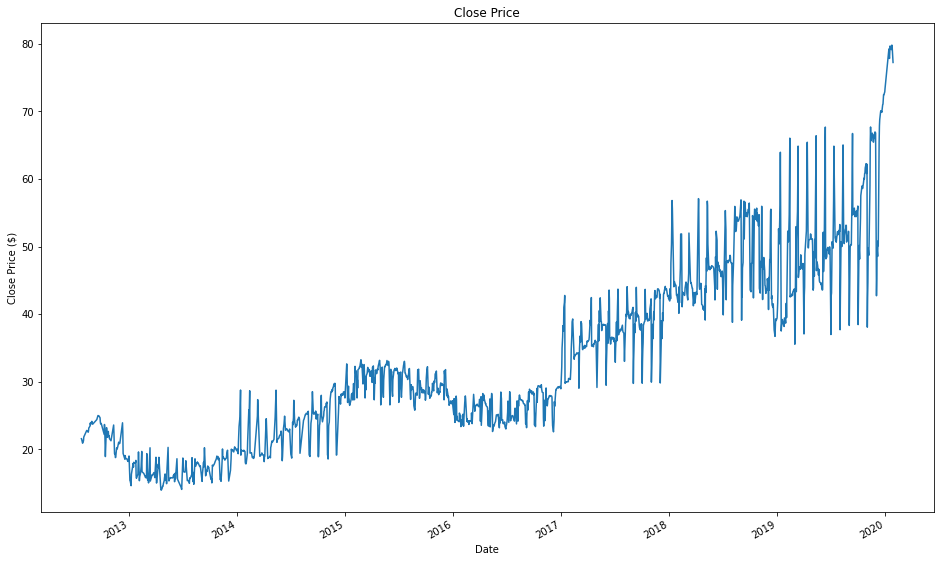

In [ ]:
# setting figure size
plt.figure(figsize=(16,10))

# plotting close price
stock_price['Close'].plot()

# setting plot title, x and y labels
plt.title("Close Price")
plt.xlabel('Date')
plt.ylabel('Close Price ($)')

In [ ]:
# calculating 7 day rolling mean
stock_price.rolling(7).mean().head(20)

,Open,High,Low,Close,Volume,label,news,opinion,compound_tit,negative_tit,neutral_tit,positive_tit,compound_con,negative_con,neutral_con,positive_con
Date,,,,,,,,,,,,,,,,
2012-07-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-07-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-07-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-07-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-07-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-07-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-07-31,21.223163,21.552807,21.039643,21.445714,467780800.0,0.857143,0.0,1.0,0.045643,0.047571,0.886857,0.065571,0.164643,0.062286,0.845286,0.092714
2012-07-31,21.268214,21.582399,21.116225,21.481072,464116800.0,0.857143,0.0,1.0,0.045643,0.047571,0.886857,0.065571,0.177414,0.064000,0.837857,0.098286
2012-08-10,21.535969,21.794950,21.363163,21.656276,485548000.0,0.714286,0.0,1.0,0.108557,0.047571,0.816571,0.135857,0.112014,0.072857,0.833143,0.094000


<Axes: xlabel='Date'>

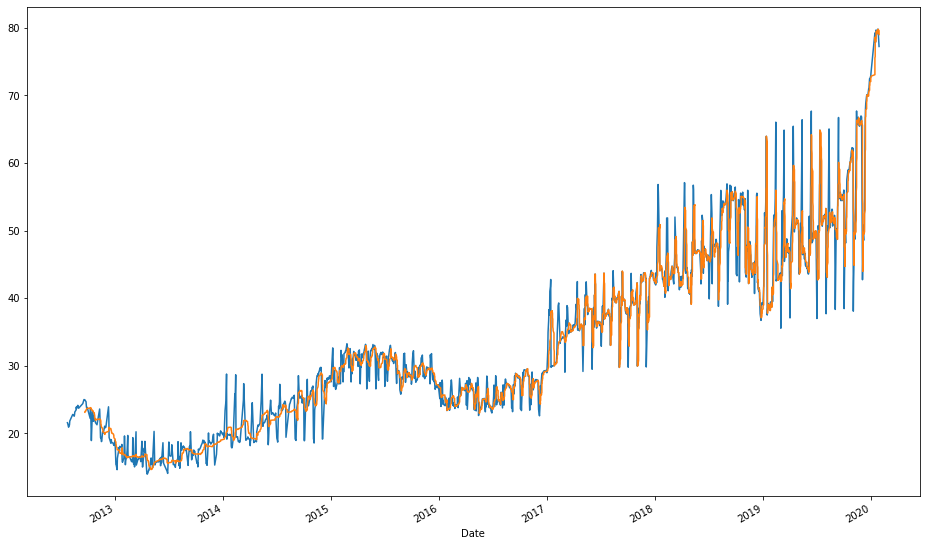

In [ ]:
# setting figure size
plt.figure(figsize=(16,10))

# plotting the close price and a 30-day rolling mean of close price
stock_price['Close'].plot()
stock_price.rolling(window=30).mean()['Close'].plot()

In [ ]:

# calculating data_to_use
percentage_of_data = 1.0
data_to_use = int(percentage_of_data*(len(stock_price)-1))

# using 80% of data for training
train_end = int(data_to_use*0.8)
total_data = len(stock_price)
start = total_data - data_to_use

# printing number of records in the training and test datasets
print("Number of records in Training Data:", train_end)
print("Number of records in Test Data:", total_data - train_end)

Number of records in Training Data: 12779
Number of records in Test Data: 3196


In [ ]:
stock_price.columns

Index(['Open', 'High', 'Low', 'Close', 'Volume', 'label', 'news', 'opinion',
       'compound_tit', 'negative_tit', 'neutral_tit', 'positive_tit',
       'compound_con', 'negative_con', 'neutral_con', 'positive_con'],
      dtype='object')

In [ ]:
# predicting one step ahead
steps_to_predict = 1

# capturing data to be used for each column
open_price = stock_price.iloc[start:total_data,0] #open
high = stock_price.iloc[start:total_data,1] #high
low = stock_price.iloc[start:total_data,2] #low
close_price = stock_price.iloc[start:total_data,3] #close
volume = stock_price.iloc[start:total_data,4] #volume
label = stock_price.iloc[start:total_data,5] #label
news = stock_price.iloc[start:total_data,6] #news
opinion = stock_price.iloc[start:total_data,7] #opinion
compound_tit = stock_price.iloc[start:total_data,8] #compound_tit
negative_tit = stock_price.iloc[start:total_data,9] #neg_tit
neutral_tit = stock_price.iloc[start:total_data,10] #neu_tit
positive_tit = stock_price.iloc[start:total_data,11] #pos_tit
compound_con=stock_price.iloc[start:total_data,12]#compound_con
negative_con=stock_price.iloc[start:total_data,13]#neg_con
neutral_con=stock_price.iloc[start:total_data,14]#neu_con
positive_con=stock_price.iloc[start:total_data,15]#pos_con

# printing close price
print("Close Price:")
close_price

Close Price:


Date
2012-07-23    21.565357
2012-07-23    21.565357
2012-07-24    21.461430
2012-07-27    20.898571
2012-07-30    21.251072
                ...    
2020-01-27    77.237503
2020-01-27    77.237503
2020-01-27    77.237503
2020-01-27    77.237503
2020-01-27    77.237503
Name: Close, Length: 15974, dtype: float64

In [ ]:
# shifting next day close
close_price_shifted = close_price.shift(-1) 

# shifting next day compound
compound_shifted_con = compound_con.shift(-1) 

compound_shifted_tit = compound_tit.shift(-1) 

# concatenating the captured training data into a dataframe
data = pd.concat([close_price, close_price_shifted, compound_con, compound_shifted_con,compound_shifted_tit,compound_tit, volume, open_price, high, low], axis=1)

# setting column names of the revised stock data
data.columns = ['close_price', 'close_price_shifted', 'compound_con', 'compound_shifted_con','compound_shifted_tit','compound_tit','volume', 'open_price', 'high', 'low']

# dropping nulls
data = data.dropna()    
data.head(10)

,close_price,close_price_shifted,compound_con,compound_shifted_con,compound_shifted_tit,compound_tit,volume,open_price,high,low
Date,,,,,,,,,,
2012-07-23,21.565357,21.565357,0.9957,-0.9239,0.0000,0.0000,487975600,21.228571,21.639286,20.989643
2012-07-23,21.565357,21.461430,-0.9239,-0.6101,0.0000,0.0000,487975600,21.228571,21.639286,20.989643
2012-07-24,21.461430,20.898571,-0.6101,0.7501,0.0000,0.0000,565132400,21.692142,21.774286,21.375357
2012-07-27,20.898571,21.251072,0.7501,-0.9588,-0.4588,0.0000,403936400,20.536072,20.922501,20.413929
2012-07-30,21.251072,21.812857,-0.9588,0.9892,0.7783,-0.4588,379142400,21.104286,21.408571,20.993570
2012-07-31,21.812857,21.812857,0.9892,0.9997,0.0000,0.7783,462327600,21.543928,21.846430,21.525715
2012-07-31,21.812857,22.791786,0.9997,0.5379,0.4404,0.0000,462327600,21.543928,21.846430,21.525715
2012-08-10,22.791786,22.560356,0.5379,-0.5994,0.0772,0.4404,637994000,23.102858,23.127144,22.718214
2012-08-14,22.560356,22.560356,-0.5994,-0.0344,0.0000,0.0772,340169200,22.566786,22.807501,22.507500


In [ ]:
# setting the target variable as the shifted close_price
y = data['close_price_shifted']
y

Date
2012-07-23    21.565357
2012-07-23    21.461430
2012-07-24    20.898571
2012-07-27    21.251072
2012-07-30    21.812857
                ...    
2020-01-27    77.237503
2020-01-27    77.237503
2020-01-27    77.237503
2020-01-27    77.237503
2020-01-27    77.237503
Name: close_price_shifted, Length: 15973, dtype: float64

In [ ]:

# setting the features dataset for prediction  
cols = ['close_price', 'compound_con',
       'compound_shifted_con', 'compound_shifted_tit', 'compound_tit',
       'volume', 'open_price', 'high', 'low']
x = data[cols]
x

,close_price,compound_con,compound_shifted_con,compound_shifted_tit,compound_tit,volume,open_price,high,low
Date,,,,,,,,,
2012-07-23,21.565357,0.9957,-0.9239,0.0000,0.0000,487975600,21.228571,21.639286,20.989643
2012-07-23,21.565357,-0.9239,-0.6101,0.0000,0.0000,487975600,21.228571,21.639286,20.989643
2012-07-24,21.461430,-0.6101,0.7501,0.0000,0.0000,565132400,21.692142,21.774286,21.375357
2012-07-27,20.898571,0.7501,-0.9588,-0.4588,0.0000,403936400,20.536072,20.922501,20.413929
2012-07-30,21.251072,-0.9588,0.9892,0.7783,-0.4588,379142400,21.104286,21.408571,20.993570
...,...,...,...,...,...,...,...,...,...
2020-01-27,77.237503,0.9994,0.9676,0.0000,0.2023,161940000,77.514999,77.942497,76.220001
2020-01-27,77.237503,0.9676,0.9965,0.3818,0.0000,161940000,77.514999,77.942497,76.220001
2020-01-27,77.237503,0.9965,0.9014,0.0000,0.3818,161940000,77.514999,77.942497,76.220001


In [ ]:
data.columns

Index(['close_price', 'close_price_shifted', 'compound_con',
       'compound_shifted_con', 'compound_shifted_tit', 'compound_tit',
       'volume', 'open_price', 'high', 'low'],
      dtype='object')

In [ ]:
# scaling the feature dataset
scaler_x = preprocessing.MinMaxScaler (feature_range=(-1, 1))
x = npp.array(x).reshape((len(x) ,len(cols)))
x = scaler_x.fit_transform(x)

# scaling the target variable
scaler_y = preprocessing.MinMaxScaler (feature_range=(-1, 1))
y = npp.array (y).reshape ((len( y), 1))
y = scaler_y.fit_transform (y)

# displaying the scaled feature dataset and the target variable
x, y

(array([[-0.76866515,  0.99569914, -0.92428486, ..., -0.77728749,
         -0.77861362, -0.77947688],
        [-0.76866515, -0.92428486, -0.61042208, ..., -0.77728749,
         -0.77861362, -0.77947688],
        [-0.77182115, -0.61042208,  0.75005001, ..., -0.76328368,
         -0.77455719, -0.76772205],
        ...,
        [ 0.92195567,  0.9964993 ,  0.90138028, ...,  0.9230437 ,
          0.91316245,  0.90369745],
        [ 0.92195567,  0.90138028,  0.99929986, ...,  0.9230437 ,
          0.91316245,  0.90369745],
        [ 0.92195567,  0.99929986,  0.99789958, ...,  0.9230437 ,
          0.91316245,  0.90369745]]), array([[-0.76866515],
        [-0.77182115],
        [-0.78891374],
        ...,
        [ 0.92195567],
        [ 0.92195567],
        [ 0.92195567]]))

In [ ]:
# preparing training and test dataset
X_train = x[0 : train_end,]
X_test = x[train_end+1 : len(x),]    
y_train = y[0 : train_end] 
y_test = y[train_end+1 : len(y)]  

# printing the shape of the training and the test datasets
print('Number of rows and columns in the Training set X:', X_train.shape, 'and y:', y_train.shape)
print('Number of rows and columns in the Test set X:', X_test.shape, 'and y:', y_test.shape)

Number of rows and columns in the Training set X: (12779, 9) and y: (12779, 1)
Number of rows and columns in the Test set X: (3193, 9) and y: (3193, 1)


In [ ]:
# reshaping the feature dataset for feeding into the model
X_train = X_train.reshape (X_train.shape + (1,)) 
X_test = X_test.reshape(X_test.shape + (1,))

# printing the re-shaped feature dataset
print('Shape of Training set X:', X_train.shape)
print('Shape of Test set X:', X_test.shape)

Shape of Training set X: (12779, 9, 1)
Shape of Test set X: (3193, 9, 1)


In [ ]:

# setting the seed to achieve consistent and less random predictions at each execution
npp.random.seed(2016)

# setting the model architecture
model=Sequential()
model.add(LSTM(100,return_sequences=True,activation='tanh',input_shape=(len(cols),1)))
model.add(Dropout(0.1))
model.add(LSTM(100,return_sequences=True,activation='tanh'))
model.add(Dropout(0.1))
model.add(LSTM(100,activation='tanh'))
model.add(Dropout(0.1))
model.add(Dense(1))

# printing the model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 9, 100)            40800     
                                                                 
 dropout (Dropout)           (None, 9, 100)            0         
                                                                 
 lstm_1 (LSTM)               (None, 9, 100)            80400     
                                                                 
 dropout_1 (Dropout)         (None, 9, 100)            0         
                                                                 
 lstm_2 (LSTM)               (None, 100)               80400     
                                                                 
 dropout_2 (Dropout)         (None, 100)               0         
                                                                 
 dense (Dense)               (None, 1)                 1

In [ ]:
# compiling the model
model.compile(loss='mse' , optimizer='adam')

# fitting the model using the training dataset
model.fit(X_train, y_train, validation_split=0.2, epochs=10, batch_size=8, verbose=1)


Epoch 1/10
1278/1278 [==============================] - 48s 29ms/step - loss: 0.0055 - val_loss: 0.0015
Epoch 2/10
1278/1278 [==============================] - 40s 31ms/step - loss: 0.0013 - val_loss: 0.0016
Epoch 3/10
1278/1278 [==============================] - 38s 29ms/step - loss: 0.0011 - val_loss: 0.0015
Epoch 4/10
1278/1278 [==============================] - 36s 28ms/step - loss: 0.0010 - val_loss: 0.0015
Epoch 5/10
1278/1278 [==============================] - 39s 30ms/step - loss: 0.0011 - val_loss: 0.0018
Epoch 6/10
1278/1278 [==============================] - 38s 30ms/step - loss: 0.0010 - val_loss: 0.0015
Epoch 7/10
1278/1278 [==============================] - 38s 30ms/step - loss: 9.4805e-04 - val_loss: 0.0018
Epoch 8/10
1278/1278 [==============================] - 38s 30ms/step - loss: 9.6427e-04 - val_loss: 0.0019
Epoch 9/10
1278/1278 [==============================] - 37s 29ms/step - loss: 9.2967e-04 - val_loss: 0.0015
Epoch 10/10
1278/1278 [=============================

In [ ]:

# performing predictions
predictions = model.predict(X_test) 

# unscaling the predictions
predictions = scaler_y.inverse_transform(npp.array(predictions).reshape((len(predictions), 1)))

# printing the predictions
print('Predictions:')
predictions[0:5]

100/100 [==============================] - 3s 10ms/step
Predictions:


array([[43.81239 ],
       [36.29597 ],
       [36.272247],
       [36.25448 ],
       [36.254177]], dtype=float32)

In [ ]:

# calculating the training mean-squared-error
train_loss = model.evaluate(X_train, y_train, batch_size = 1)

# calculating the test mean-squared-error
test_loss = model.evaluate(X_test, y_test, batch_size = 1)

# printing the training and the test mean-squared-errors
print('Train Loss =', round(train_loss,4))
print('Test Loss =', round(test_loss,4))

3193/3193 [==============================] - 16s 5ms/step - loss: 0.0050
Train Loss = 0.0008
Test Loss = 0.005


In [ ]:

# calculating root mean squared error
root_mean_square_error = npp.sqrt(npp.mean(npp.power((y_test - predictions),2)))
print('Root Mean Square Error =', round(root_mean_square_error,4))

Root Mean Square Error = 54.767


In [ ]:
# calculating root mean squared error using sklearn.metrics package
rmse = metrics.mean_squared_error(y_test, predictions)
print('Root Mean Square Error (sklearn.metrics) =', round(npp.sqrt(rmse),4))

Root Mean Square Error (sklearn.metrics) = 54.767


In [ ]:
# unscaling the test feature dataset, x_test
X_test = scaler_x.inverse_transform(npp.array(X_test).reshape((len(X_test), len(cols))))

# unscaling the test y dataset, y_test
y_train = scaler_y.inverse_transform(npp.array(y_train).reshape((len(y_train), 1)))
y_test = scaler_y.inverse_transform(npp.array(y_test).reshape((len(y_test), 1)))

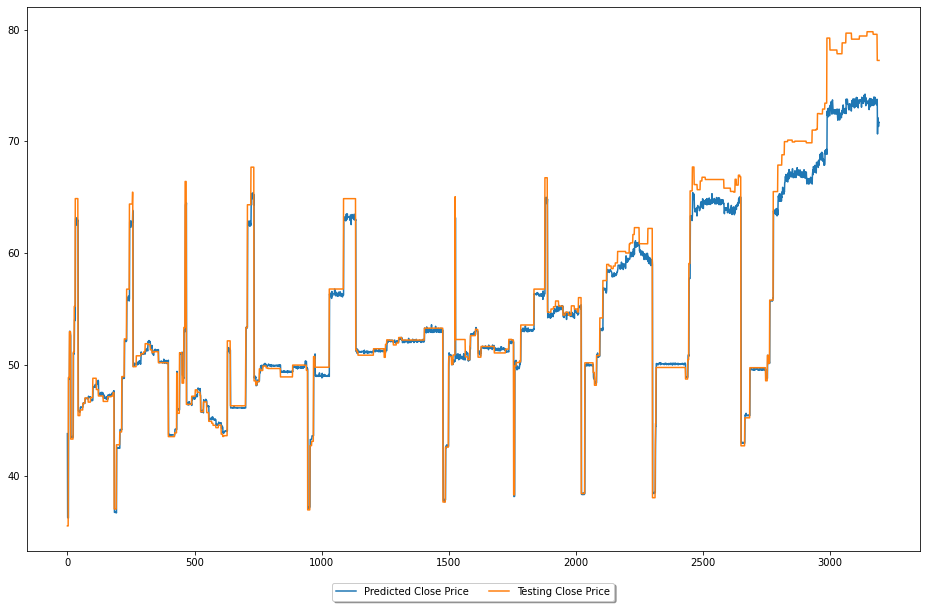

In [ ]:
# plotting
plt.figure(figsize=(16,10))

# plt.plot([row[0] for row in y_train], label="Training Close Price")
plt.plot(predictions, label="Predicted Close Price")
plt.plot([row[0] for row in y_test], label="Testing Close Price")
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=2)
plt.show()